In [ ]:
import tensorflow as tf
from zipfile import ZipFile
import matplotlib.pyplot as plt
import os,glob
import cv2
import shutil
import os
import random
from zipfile import ZipFile as zipfile
from tqdm._tqdm_notebook import tqdm_notebook as tqdm
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Convolution2D, Dropout, Dense,MaxPooling2D
from keras.layers import BatchNormalization
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from zipfile import ZipFile

<ipython-input-2-19eb5915ca7a>:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.*` instead of `tqdm._tqdm_notebook.*`
  from tqdm._tqdm_notebook import tqdm_notebook as tqdm


In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json



Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 71 bytes


In [ ]:
!kaggle datasets download -d syedabdullahsaad/plant-species

100% 4.18G/4.19G [00:44<00:00, 79.9MB/s]
100% 4.19G/4.19G [00:44<00:00, 100MB/s] 


In [ ]:

# Define the path to the ZIP archive.
file_name = "/content/plant-species.zip"

# Create a target directory for extraction.
target_directory = "/content/drive/MyDrive"
if not os.path.exists(target_directory):
    os.makedirs(target_directory)

# Open the ZIP archive and extract all species data.
with ZipFile(file_name, 'r') as zip:
    # Extract all contents from the ZIP archive to the target directory.
    zip.extractall(target_directory)

print('Done')

Done


In [ ]:
import os
import shutil
import random

# Step 1: Data Quality Assessment

# Define the source directory where your plant species data is located.
source_dir = '/content/drive/MyDrive/train_a_tensorflow-lite_model_for_identifying_plant_species/train/images'
output_dir = '/content/drive/MyDrive/train_a_tensorflow-lite_model_for_identifying_plant_species/*'

os.makedirs(output_dir, exist_ok=True)

# Loop through the source directory to process each plant species folder.
for species_folder in os.listdir(source_dir):
    species_path = os.path.join(source_dir, species_folder)
    output_species_path = os.path.join(output_dir, species_folder)

    os.makedirs(output_species_path, exist_ok=True)

In [31]:
# Define the path to the directory where the species folders are located.
directory_path = '/content/drive/MyDrive/train_a_tensorflow-lite_model_for_identifying_plant_species/train/images'
# List the species names in the specified directory.
species_names = os.listdir(directory_path)

# Filter out only subdirectories (species names).
species_names = [name for name in species_names if os.path.isdir(os.path.join(directory_path, name))]

# Print the list of species names.
print("Species available in the directory:")
for species_name in species_names:
    print(species_name)


Species available in the directory:
abies balsamea (l.) mill
acer macrophyllum pursh
acer negundo l
acer pensylvanicum l
acer platanoides l
acer rubrum l
achillea millefolium l
aesculus californica (spach) nutt
anaphalis margaritacea (l.) benth. and hook.f
aquilegia canadensis l
aquilegia formosa fisch. ex dc
asplenium bulbiferum g. forst
baccharis caerulescens dc
baccharis pilularis dc
berberis thunbergii dc
callicarpa americana l
calypso bulbosa (l.) oakes
carduus occidentalis nutt
cephalanthus occidentalis l
cercis canadensis l
chamaecrista fasciculata (michx.) greene
chelidonium majus l
cornus florida l
cynoglossum grande douglas ex lehm
cypripedium acaule aiton
cytisus scoparius (l.) link
datura stramonium l
datura wrightii regel
daucus carota l
dipsacus fullonum l
drosera rotundifolia l
duchesnea indica (jacks.) focke
erythronium americanum ker gawl
fagus grandifolia ehrh
ficaria verna huds
ficus carica l
fraxinus americana l
geranium maculatum l
glechoma hederacea l
gleditsia tr

In [34]:
# Define the source directory where all species folders are located.
source_directory = '/content/drive/MyDrive/train_a_tensorflow-lite_model_for_identifying_plant_species/train/images'

# Define the target directory where you want to extract the selected species.
target_directory = '/content/drive/MyDrive/five_species'

# Define the list of specific species you want to extract.
selected_species = [
'typha latifolia l',
'ulex europaeus l',
'ulmus americana l',
'urtica dioica l',
'yucca brevifolia engelm'
]

# Create the target directory if it doesn't exist.
if not os.path.exists(target_directory):
    os.makedirs(target_directory)

# Iterate through the selected species and extract them to the target directory.
for species_name in selected_species:
    source_path = os.path.join(source_directory, species_name)
    target_path = os.path.join(target_directory, species_name)

    if os.path.exists(source_path):
        shutil.copytree(source_path, target_path)

print('Extraction of selected species is complete.')


Extraction of selected species is complete.


In [36]:
import shutil

# data_directory = 'path_to_data_directory'

# Define the path to the directory where you want to create the train, test, and validation folders.
split_data_directory = '/content/drive/MyDrive/running'
os.makedirs(split_data_directory, exist_ok=True)

# Get a list of the five plant species folders.
species_folders = os.listdir(target_directory) # Limit to the first five species.

# Define the percentage splits for train, test, and validation.
train_split = 0.6  # 60% for training
test_split = 0.2   # 20% for testing
val_split = 0.2    # 20% for validation

# Iterate through each of the five species folders and split the data.
for species_folder in species_folders:
    species_path = os.path.join(target_directory, species_folder)

    # Create train, test, and validation directories for each species.
    train_dir = os.path.join(split_data_directory, 'train', species_folder)
    test_dir = os.path.join(split_data_directory, 'test', species_folder)
    val_dir = os.path.join(split_data_directory, 'val', species_folder)

    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)

    # List all image files in the current species folder.
    image_files = [file for file in os.listdir(species_path) if file.endswith(('.jpg', '.jpeg', '.png'))]

    # Use train_test_split to split the data into train, test, and validation sets.
    train_files, test_val_files = train_test_split(image_files, test_size=(test_split + val_split), random_state=42)
    test_files, val_files = train_test_split(test_val_files, test_size=(val_split / (test_split + val_split)), random_state=42)

    # Copy images to the corresponding directories.
    for file in train_files:
        src = os.path.join(species_path, file)
        dst = os.path.join(train_dir, file)
        shutil.copy(src, dst)

    for file in test_files:
        src = os.path.join(species_path, file)
        dst = os.path.join(test_dir, file)
        shutil.copy(src, dst)

    for file in val_files:
        src = os.path.join(species_path, file)
        dst = os.path.join(val_dir, file)
        shutil.copy(src, dst)


In [69]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define an ImageDataGenerator for data augmentation.
datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values to [0, 1]
    rotation_range=40,  # Randomly rotate images by up to 40 degrees
    width_shift_range=0.2,  # Randomly shift image width by up to 20%
    height_shift_range=0.2,  # Randomly shift image height by up to 20%
    shear_range=0.2,  # Shear transformations
    zoom_range=0.2,  # Randomly zoom in by up to 20%
    horizontal_flip=True,  # Randomly flip images horizontally
    fill_mode='nearest'  # Fill mode for newly created pixels
)


# data_augmentation = ImageDataGenerator(
#     rotation_range=20,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     horizontal_flip=True,
#     rescale=1.0 / 255.0
# )

In [70]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import LearningRateScheduler

from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import LearningRateScheduler

# Define the number of classes (plant species) in your dataset.
num_classes = 5

# Define the input size expected by VGG-16.
input_shape = (224, 224, 3)

# Load the VGG-16 base model (excluding the top classification layers).
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

# Add custom top classification layers for your specific task.
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)  # You can adjust the number of units as needed.
predictions = Dense(num_classes, activation='softmax')(x)

# Create the final VGG-16 model.
model = Model(inputs=base_model.input, outputs=predictions)

def learning_rate_scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * 0.1

# Create a custom learning rate scheduler callback.
lr_scheduler = LearningRateScheduler(learning_rate_scheduler)

# Define the optimizer with a fixed learning rate (you don't need to pass the scheduler here).
optimizer = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)

# Compile the model with the optimizer and learning rate scheduler callback.
model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Display a summary of the model architecture.
model.summary()


Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [71]:

# data_augmentation = ImageDataGenerator(
#     rescale=1.0 / 255.0,  # Normalize pixel values to [0, 1]
#     rotation_range=40,  # Randomly rotate images by up to 40 degrees
#     width_shift_range=0.2,  # Randomly shift image width by up to 20%
#     height_shift_range=0.2,  # Randomly shift image height by up to 20%
#     shear_range=0.2,  # Shear transformations
#     zoom_range=0.2,  # Randomly zoom in by up to 20%
#     horizontal_flip=True,  # Randomly flip images horizontally
#     fill_mode='nearest'  # Fill mode for newly created pixels
# )


# Define the image dimensions you want to use.
image_height = 224
image_width = 224
batch_size = 64  # Increase batch size for better GPU utilization











# Create data generators for the training
train_generator = data_augmentation.flow_from_directory(
    '/content/drive/MyDrive/running/train',
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True  # Shuffle the training data
)


# Create a data for validation
validation_generator = data_augmentation.flow_from_directory(
    '/content/drive/MyDrive/running/val',
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True  # Shuffle the validation data
)






# Create a data generator for the test set.
test_generator = data_augmentation.flow_from_directory(
    '/content/drive/MyDrive/running/test',
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 890 images belonging to 5 classes.
Found 299 images belonging to 5 classes.
Found 297 images belonging to 5 classes.


In [72]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50  # You can replace with your preferred architecture
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping
from tensorflow.keras.regularizers import l2

# Define the number of classes (plant species) in your dataset.
num_classes = 5

# Define the input size expected by the chosen architecture.
input_shape = (224, 224, 3)

# Load the pre-trained model (ResNet-50 in this example) excluding top layers.
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

# Add custom top classification layers for your specific task.
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.001))(x)  # Apply L2 regularization
predictions = Dense(num_classes, activation='softmax')(x)

# Create the final model.
model = Model(inputs=base_model.input, outputs=predictions)

# Implement a custom learning rate scheduler.
def learning_rate_scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * 0.1

# Compile the model with Adam optimizer, custom learning rate scheduler, and L2 regularization.
optimizer = Adam(learning_rate=0.001)
lr_scheduler = LearningRateScheduler(learning_rate_scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10)  # Early stopping to prevent overfitting

model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Display a summary of the model architecture.
model.summary()

# Train the model
history = model.fit(
    train_generator,
    epochs=11,
    batch_size=batch_size,
    validation_data=validation_generator,
    callbacks=[lr_scheduler, early_stopping],
    verbose=1
)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(train_generator)  # Replace with your test data generator.

# print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
# print(f"Test Loss: {test_loss:.4f}")
# Train the model.


# Display the training accuracy.
training_accuracy = history.history['accuracy'][-1]
print(f"Training Accuracy: {training_accuracy * 100:.2f}%")


Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_8[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [74]:
training_accuracy = history.history['accuracy'][-1]
print(f"Training Accuracy: {training_accuracy * 100:.2f}%")

Training Accuracy: 94.16%


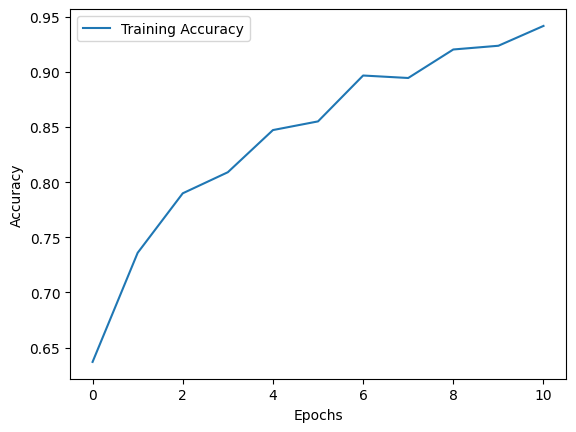

In [73]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [82]:
model.save('/content/drive/MyDrive/train_a_tensorflow-lite_model_for_identifying_plant_species/species_vgg16.h5')

In [83]:
from tensorflow.keras.models import load_model

# Load the saved model
loaded_model = load_model('/content/drive/MyDrive/train_a_tensorflow-lite_model_for_identifying_plant_species/species_vgg16.h5')


In [76]:
# Assuming you have a new image you want to classify.
new_image = load_and_preprocess_new_image('/content/drive/MyDrive/running/test/typha latifolia l/369408.jpg')
# Perform prediction on the new image.
predictions = model.predict(np.array([new_image]))

# Get the class with the highest probability.
predicted_class = np.argmax(predictions)

# Display the predicted class.
print(f"Predicted class index: {predicted_class}")

1/1 [==============================] - 2s 2s/step
Predicted class index: 1


In [88]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np

# Load the saved model
loaded_model = load_model('/content/drive/MyDrive/train_a_tensorflow-lite_model_for_identifying_plant_species/species_vgg16.h5')  # Replace 'your_model.h5' with your saved model file path

# List of paths to the test images you want to predict
test_image_paths = [
    '/content/drive/MyDrive/running/test/typha latifolia l/369390.jpg',  # Replace with the path to your image files
    '/content/drive/MyDrive/running/test/ulex europaeus l/369766.jpg',
    '/content/drive/MyDrive/running/test/ulmus americana l/370208.jpg',
    '/content/drive/MyDrive/running/test/urtica dioica l/371506.jpg',
    '/content/drive/MyDrive/running/test/urtica dioica l/371536.jpg',
    '/content/drive/MyDrive/running/test/typha latifolia l/369402.jpg',
    '/content/drive/MyDrive/running/test/typha latifolia l/369442.jpg',
    '/content/drive/MyDrive/running/test/typha latifolia l/369581.jpg',
    '/content/drive/MyDrive/running/test/ulmus americana l/370304.jpg',
    '/content/drive/MyDrive/running/test/ulmus americana l/370278.jpg'





    # Add more image paths as needed
]

# Define the input size for your model
input_size = (224, 224)

# Iterate through the test image paths and make predictions
for image_path in test_image_paths:
    # Load and preprocess the image
    img = load_img(image_path, target_size=input_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = preprocess_input(img)

    # Make predictions using the loaded model
    predictions = loaded_model.predict(img)

    # Decode the predictions (if you have class labels)
    # Example: class_index = np.argmax(predictions)
    # class_label = class_labels[class_index]  # Replace with your class labels

    # Print the results
    print(f"Image: {image_path}")
    print(f"Predictions: {predictions}")
    # Uncomment the following line if you have class labels
    # print(f"Predicted Class: {class_label}\n")


1/1 [==============================] - 1s 930ms/step
Image: /content/drive/MyDrive/running/test/typha latifolia l/369390.jpg
Predictions: [[0.09082959 0.01631277 0.01500139 0.02685219 0.851004  ]]
1/1 [==============================] - 0s 29ms/step
Image: /content/drive/MyDrive/running/test/ulex europaeus l/369766.jpg
Predictions: [[0. 1. 0. 0. 0.]]
1/1 [==============================] - 0s 24ms/step
Image: /content/drive/MyDrive/running/test/ulmus americana l/370208.jpg
Predictions: [[0. 1. 0. 0. 0.]]
1/1 [==============================] - 0s 23ms/step
Image: /content/drive/MyDrive/running/test/urtica dioica l/371506.jpg
Predictions: [[2.5916256e-08 6.2268460e-05 6.7774345e-06 9.9532819e-01 4.6027740e-03]]
1/1 [==============================] - 0s 24ms/step
Image: /content/drive/MyDrive/running/test/urtica dioica l/371536.jpg
Predictions: [[2.0602612e-28 6.9005302e-16 2.9513273e-25 4.4068782e-21 1.0000000e+00]]
1/1 [==============================] - 0s 25ms/step
Image: /content/drive/

In [90]:
# Define the input size for your model
input_size = (224, 224)

# Create a subplot for each test image
plt.figure(figsize=(500, 200))

for i, image_path in enumerate(test_image_paths):
    # Load and preprocess the image
    img = load_img(image_path, target_size=input_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = preprocess_input(img)

    # Make predictions using the loaded model
    predictions = loaded_model.predict(img)

    # Decode the predictions (if you have class labels)
    # Example: class_index = np.argmax(predictions)
    # class_label = class_labels[class_index]  # Replace with your class labels

    # Display the image and predictions
    plt.subplot(1, len(test_image_paths), i + 1)
    plt.imshow(load_img(image_path))
    plt.title(f"Predictions: {predictions}")
    # Uncomment the following line if you have class labels
    # plt.title(f"Predicted Class: {class_label}")

# Show the images and predictions
plt.show()

1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 23ms/step


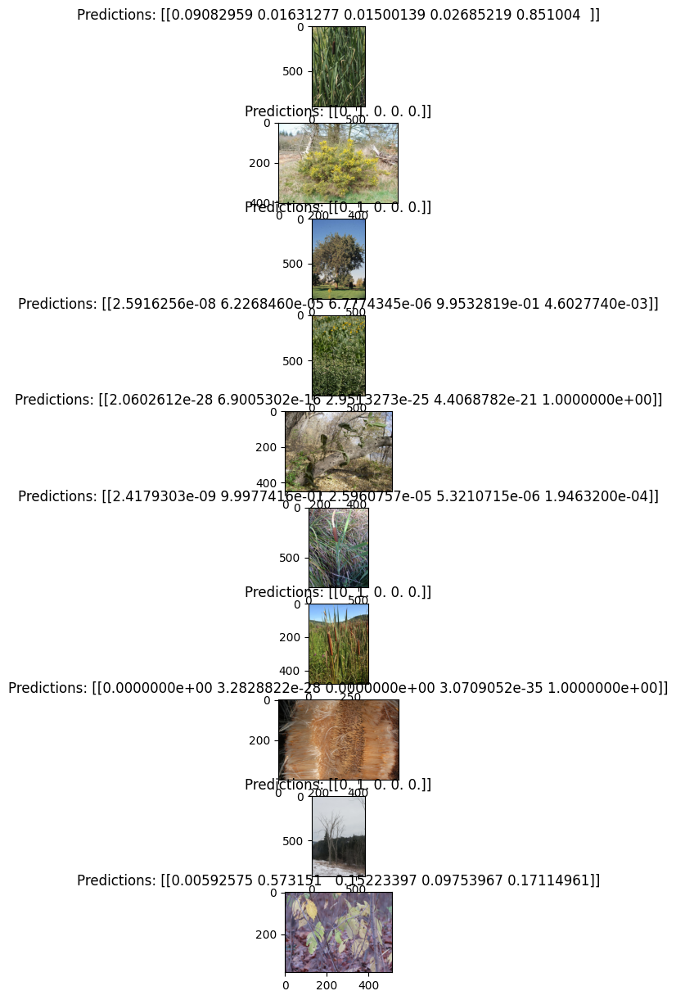

In [91]:
# Define the input size for your model
input_size = (224, 224)

# Create a subplot for each test image
plt.figure(figsize=(5, 15))  # Adjust the figure size as needed

for i, image_path in enumerate(test_image_paths):
    # Load and preprocess the image
    img = load_img(image_path, target_size=input_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = preprocess_input(img)

    # Make predictions using the loaded model
    predictions = loaded_model.predict(img)

    # Decode the predictions (if you have class labels)
    # Example: class_index = np.argmax(predictions)
    # class_label = class_labels[class_index]  # Replace with your class labels

    # Display the image and predictions
    plt.subplot(len(test_image_paths), 1, i + 1)  # Set rows to len(test_image_paths) and columns to 1
    plt.imshow(load_img(image_path))
    plt.title(f"Predictions: {predictions}")
    # Uncomment the following line if you have class labels
    # plt.title(f"Predicted Class: {class_label}")

# Show the images and predictions
plt.show()


1/1 [==============================] - 0s 24ms/step


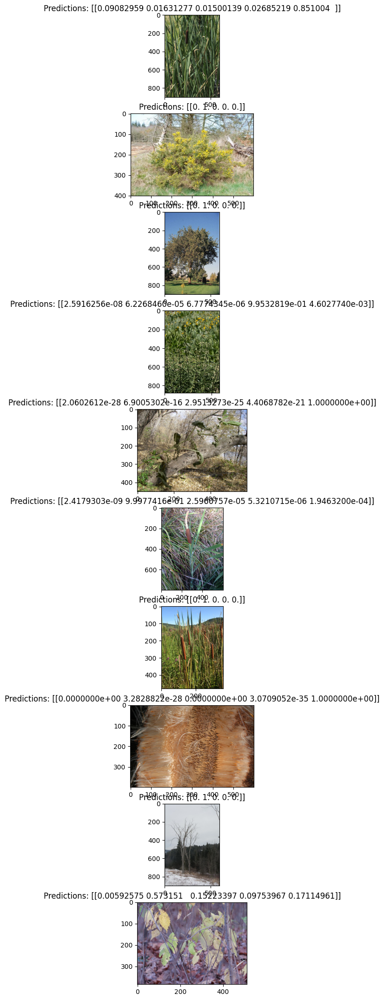

In [92]:
# Define the input size for your model
input_size = (224, 224)
vertical_gap = 20  # Adjust the vertical gap as needed

# Create a subplot for each test image
plt.figure(figsize=(5, 15))  # Adjust the figure size as needed

for i, image_path in enumerate(test_image_paths):
    # Load and preprocess the image
    img = load_img(image_path, target_size=input_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    img = preprocess_input(img)

    # Make predictions using the loaded model
    predictions = loaded_model.predict(img)

    # Decode the predictions (if you have class labels)
    # Example: class_index = np.argmax(predictions)
    # class_label = class_labels[class_index]  # Replace with your class labels

    # Calculate the vertical position for the current image
    vertical_position = i * (input_size[1] + vertical_gap)

    # Display the image and predictions with vertical spacing
    plt.subplot(len(test_image_paths), 1, i + 1)  # Set rows to len(test_image_paths) and columns to 1
    plt.imshow(load_img(image_path))
    plt.title(f"Predictions: {predictions}")
    # Uncomment the following line if you have class labels
    # plt.title(f"Predicted Class: {class_label}")

    # Set the vertical position
    plt.subplots_adjust(top=1.5)  # Adjust the value for spacing

# Show the images and predictions
plt.show()
